In [7]:
%pip install pandas numpy
%pip install matplotlib seaborn

Note: you may need to restart the kernel to use updated packages.
  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
  Using cached cycler-0.12.1-py3-none-any.whl.metadata (3.8 kB)
   ---------------------------------------- 0.0/8.3 MB ? eta -:--:--
   ----- ---------------------------------- 1.0/8.3 MB 6.3 MB/s eta 0:00:02
   ------------ --------------------------- 2.6/8.3 MB 6.6 MB/s eta 0:00:01
   ------------------- -------------------- 3.9/8.3 MB 6.5 MB/s eta 0:00:01
   ------------------------ --------------- 5.0/8.3 MB 6.4 MB/s eta 0:00:01
   ------------------------------ --------- 6.3/8.3 MB 6.2 MB/s eta 0:00:01
   -------------------------------------- - 7.9/8.3 MB 6.3 MB/s eta 0:00:01
   ---------------------------------------- 8.3/8.3 MB 6.2 MB/s  0:00:01
Using cached seaborn-0.13.2-py3-none-any.whl (294 kB)
Using cached cycler-0.12.1-py3-none-any.whl (8.3 kB)
   ---------------------------------------- 0.0/2.3 MB ? eta -:--:--
   ---------------------- -----

In [9]:
# check versions

import pandas as pd
print("Pandas version:", pd.__version__)

import numpy as np
print("NumPy version:", np.__version__)

import seaborn as sns
print("Seaborn version:", sns.__version__)

Pandas version: 3.0.1
NumPy version: 2.4.2
Seaborn version: 0.13.2


# 1. Load and clean the data

In [26]:
# load the data (politics trial data) and check the first 5 rows
TSV_INPUT_FILES = "data/politics/trial_data.tsv"

df = pd.read_csv(TSV_INPUT_FILES, sep="\t")
print(df.info())

<class 'pandas.DataFrame'>
RangeIndex: 2230 entries, 0 to 2229
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype
---  ------               --------------  -----
 0   id                   2230 non-null   int64
 1   pubtime              2230 non-null   str  
 2   medium_code          2230 non-null   str  
 3   medium_name          2230 non-null   str  
 4   rubric               1523 non-null   str  
 5   regional             85 non-null     str  
 6   doctype              2230 non-null   str  
 7   doctype_description  2230 non-null   str  
 8   language             2230 non-null   str  
 9   char_count           2230 non-null   int64
 10  dateline             707 non-null    str  
 11  head                 2230 non-null   str  
 12  subhead              771 non-null    str  
 13  article_link         517 non-null    str  
 14  content_id           2230 non-null   str  
 15  content              2230 non-null   str  
dtypes: int64(2), str(14)
memory usage: 

In [27]:
df.head()

,id,pubtime,medium_code,medium_name,rubric,regional,doctype,doctype_description,language,char_count,dateline,head,subhead,article_link,content_id,content
0,59217348,2025-12-16 00:00:00+01,NZZ,Neue Zürcher Zeitung,International,NaN,PND,National daily newspaper,de,7943,NaN,Die Rechte erlebt in Chile eine Renaissance,José Antonio Kast hat Bewunderung für Pinochet...,NaN,00001ef5-51e6-8675-aa14-11ff39c435b3,"<tx><au>Alexander Busch, São Paulo</au><p>Der ..."
1,57420390,2025-07-02 00:00:00+02,ZWA,20 minuten,SCHWEIZ,Bern,PRD,Regional daily newspaper,de,928,NaN,Plus 53700 Personen: Zuwanderung sinkt,NaN,NaN,0044e4e8-3c47-357b-be69-5f5d1f00de30,<tx><p>BERN Laut dem gestern veröffentlichten ...
2,59001383,2025-11-27 06:09:24+01,SRF,srf.ch,NaN,NaN,WWE,Online medium,de,5351,Die 10-Millionen-Schweiz,Die 10-Millionen-Schweiz – Neuer Bericht des B...,NaN,https://www.srf.ch/news/schweiz/die-10-million...,007c6011-aa12-7f86-77e8-4ec461f4b1eb,<tx><ld><p>Der Bund wägt Chancen und Risiken d...
3,56556321,2025-04-04 11:06:29+02,SRF,srf.ch,NaN,NaN,WWE,Online medium,de,4528,Aufschwung durch Mobilität,Nidwaldens Wandel: Von Armut zu Wohlstand dank...,NaN,https://www.srf.ch/news/schweiz/aufschwung-dur...,007cb957-df3e-50f0-8fa6-ccfa1277fa0f,<tx><ld><p>Vom Agrarkanton zum Steuerparadies:...
4,56555704,2025-04-04 10:39:41+02,SRF,srf.ch,NaN,NaN,WWE,Online medium,de,4528,Aufschwung durch Mobilität,Nidwalden liegt mittendrin – und war doch lang...,NaN,https://www.srf.ch/news/schweiz/aufschwung-dur...,007cb957-df3e-50f0-8fa6-ccfa1277fa0f,<tx><ld><p>Vom Agrarkanton zum Steuerparadies:...


In [35]:
# extract relevant columns for analysis
relevant_columns = ["id", "pubtime", "medium_code", "language", "head", "content"]
df_mod = df[relevant_columns]

# modify pubtime to datetime format, remove timezone information and time (only keep date)
df_mod["pubtime"] = pd.to_datetime(df_mod["pubtime"], errors="coerce", utc=True).dt.date
print(df_mod.info())

print(df_mod["pubtime"].head())

<class 'pandas.DataFrame'>
RangeIndex: 2230 entries, 0 to 2229
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           2230 non-null   int64 
 1   pubtime      2230 non-null   object
 2   medium_code  2230 non-null   str   
 3   language     2230 non-null   str   
 4   head         2230 non-null   str   
 5   content      2230 non-null   str   
dtypes: int64(1), object(1), str(4)
memory usage: 104.7+ KB
None
0    2025-12-15
1    2025-07-01
2    2025-11-27
3    2025-04-04
4    2025-04-04
Name: pubtime, dtype: object


# 2. Initial data exploration

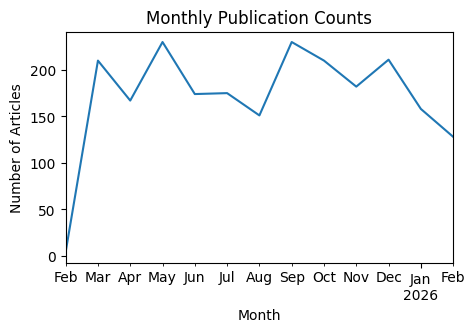

In [41]:
# analyze the volume of publication dates by months as a line graph

import matplotlib.pyplot as plt
# convert pubtime to datetime format for plotting
df_mod["pubtime"] = pd.to_datetime(df_mod["pubtime"], errors="coerce")
# group by month and count the number of publications
df_mod["month"] = df_mod["pubtime"].dt.to_period("M")
monthly_counts = df_mod.groupby("month").size()

# plot the monthly publication counts
plt.figure(figsize=(5, 3))
monthly_counts.plot(kind="line")
plt.xlabel("Month")
plt.ylabel("Number of Articles")
plt.title("Monthly Publication Counts")
plt.show()

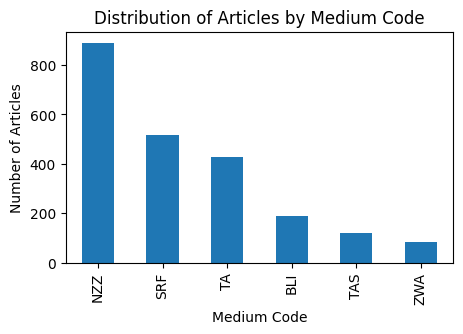

In [42]:
# Count the distribution base on medium_code and plot as a bar graph
medium_counts = df_mod["medium_code"].value_counts()
plt.figure(figsize=(5, 3))
medium_counts.plot(kind="bar")
plt.xlabel("Medium Code")
plt.ylabel("Number of Articles")
plt.title("Distribution of Articles by Medium Code")
plt.show()

In [43]:
# print unique languages in the dataset
unique_languages = df_mod["language"].unique()
print("Unique languages in the dataset:", unique_languages)

Unique languages in the dataset: <StringArray>
['de']
Length: 1, dtype: str


In [ ]:
# count number per unique head in the dataset (to check duplicates)
head_counts = df_mod["head"].value_counts()
print("Number of duplicate heads:", (head_counts > 1).sum())

# check if there are exact duplicates, i.e., same head and same content
duplicate_rows = df_mod[df_mod.duplicated(subset=["head", "content"], keep=False)]
print("Number of exact duplicate rows (same head and content):", duplicate_rows.shape[0])

# print all duplicated heads and their counts
duplicated_heads = duplicate_rows["head"].value_counts()
print("Duplicated heads and their counts:")
print(duplicated_heads)

Number of duplicate heads: 23
Number of exact duplicate rows (same head and content): 14
Duplicated heads and their counts:
head
Liberal gegen rechts: Ein enges Rennen zeichnet sich ab                                          4
Steigende Mieten – Jugendliche nehmen Politik in Pflicht                                         2
Zwei Jahre vor den Wahlen – Wahlbarometer zeigt: SVP mit historischem Hoch – Liberale im Tief    2
Japans Regierungskoalition steht vor Wahlschlappe                                                2
Heiraten und Kinderkriegen ist in der Schweiz out                                                2
Friedrich Merz, die SPD und die Fahne im Wind                                                    2
Name: count, dtype: int64


In [54]:
# only leave one instance of each duplicated head (keep the first occurrence)
df_mod_unique = df_mod.drop_duplicates(subset=["head"], keep="first")
print("Number of unique heads after removing duplicates:", df_mod_unique["head"].nunique())

Number of unique heads after removing duplicates: 2168


In [56]:
print(df_mod_unique.info())

# keep only relevant_columns for further analysis and save as a new cleaned csv file
df_mod_unique = df_mod_unique[relevant_columns]

CLEANED_UNIQUE_CSV_OUTPUT = "data/politics/cleaned_trial_data.csv"
df_mod_unique.to_csv(CLEANED_UNIQUE_CSV_OUTPUT, index=False)

<class 'pandas.DataFrame'>
Index: 2168 entries, 0 to 2229
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype        
---  ------       --------------  -----        
 0   id           2168 non-null   int64        
 1   pubtime      2168 non-null   datetime64[s]
 2   medium_code  2168 non-null   str          
 3   language     2168 non-null   str          
 4   head         2168 non-null   str          
 5   content      2168 non-null   str          
 6   month        2168 non-null   period[M]    
dtypes: datetime64[s](1), int64(1), period[M](1), str(4)
memory usage: 135.5 KB
None


### ===== Remaining codes from previous project =====

In [21]:
# The xml is table format. We need to parse it and extract relevant fields.
# Get the part <stats>...</stats> and extract relevant fields.
# The relevant item is on <observation>...</observation> with fields: <a_head>, <a_pubdate>, <a_source>, <a_articleURL>
# and turn them into a pandas dataframe.
import pandas as pd
from xml.etree import ElementTree as ET

data = []
for lan, xml_text in lan_text.items():
    root = ET.fromstring(xml_text)
    observations = root.findall('.//observation')

    for obs in observations:
        a_head = obs.find('a_head').text if obs.find('a_head') is not None else None
        a_pubdate = obs.find('a_pubdate').text if obs.find('a_pubdate') is not None else None
        a_source = obs.find('a_source').text if obs.find('a_source') is not None else None
        a_articleURL = obs.find('a_articleURL').text if obs.find('a_articleURL') is not None else None
        a_subhead = obs.find('a_subhead').text if obs.find('a_subhead') is not None else None
        data.append({
            'head': a_head,
            'pubdate': a_pubdate,
            'source': a_source,
            'articleURL': a_articleURL,
            'subtitle': a_subhead,
            'language': lan
        })
    
df = pd.DataFrame(data)
# draw bar time series of number of articles per month
# in x label data put only years
df['pubdate'] = pd.to_datetime(df['pubdate'], errors='coerce')
df.head()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23191 entries, 0 to 23190
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   head        23191 non-null  object        
 1   pubdate     23191 non-null  datetime64[ns]
 2   source      23191 non-null  object        
 3   articleURL  23191 non-null  object        
 4   subtitle    10165 non-null  object        
 5   language    23191 non-null  object        
dtypes: datetime64[ns](1), object(5)
memory usage: 1.1+ MB


In [6]:
df['source'].unique()

array(['TA', 'CASO', 'SHZ', 'FUWO', 'NZZS', 'SGTO', 'SIO', 'SGT', 'NZZO',
       'HZI', 'BU', 'NNBE', 'SRF', 'SRFA', 'SHZO', 'NNBU', 'FUW', 'NZZ',
       'ZWAO', 'NNBS', 'ZHUL', 'BEOLO', 'BZ', 'SWII', 'NNTA', 'LBO',
       'ZSZO', 'BAZ', 'NZZG', 'NLZ', 'LTZO', 'BIZ', 'LTZ', 'ZHUO', 'BLIO',
       'LUZO', 'BLI', 'AZM', 'LUZ', 'WEW', 'ZWA', 'WOZ', 'BLIA', 'GTB',
       'FACT', 'BT', 'LATO', 'BZBO', 'SRFV', 'LB', 'THTO', 'APPZ', 'NMZ',
       'TAE', 'NZZF', 'BZB', 'BZM', 'OBW', 'SFTV', 'BEOO', 'TAS', 'NN',
       'SOZO', 'WEOB', 'THT', 'BIZO', 'URZ', 'NIW', 'TASI', 'SBLI', 'TVS',
       'AZO', 'TBT', 'TAM', 'SOZM', 'ZSZ', 'SF', 'ZN', 'OLT', 'SONT',
       'TVLL', 'ZOF', 'OAS', 'BEOL', 'WEWD', 'GP', 'SI', 'TZ', 'TAZT',
       'NZZM', 'ZUGP', 'SCHV', 'ZUGZ', 'WZ', 'CASH', 'TELE', 'BEO',
       'NZZB', 'BOL', 'NLZS', 'LAL', 'GTBO', 'NNTZ', 'NEWS', 'BTO', 'BRS',
       'AZ', 'SAW', 'SAS', 'OLTO', 'HEUT', 'SWO', 'WEWO', 'SIS', 'BEON',
       'LTB', 'ZWAF', 'SIG', 'SCHB', 'CVAL', 'GES', 'CDAY',

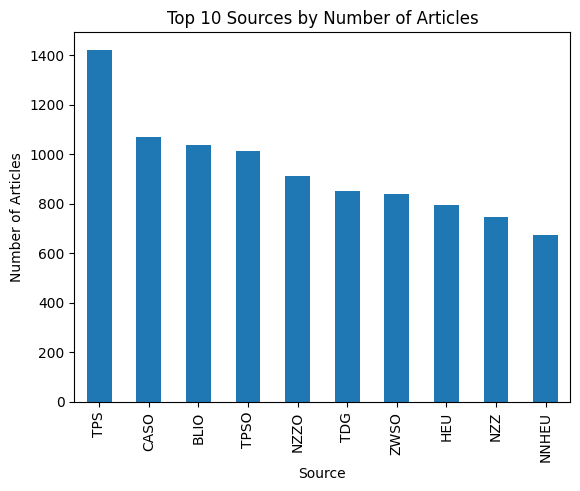

In [7]:
# draw bar chart of top 10 sources
import matplotlib.pyplot as plt 
top_sources = df['source'].value_counts().head(10)
top_sources.plot(kind='bar')
plt.xlabel('Source')
plt.ylabel('Number of Articles')
plt.title('Top 10 Sources by Number of Articles')
plt.show()

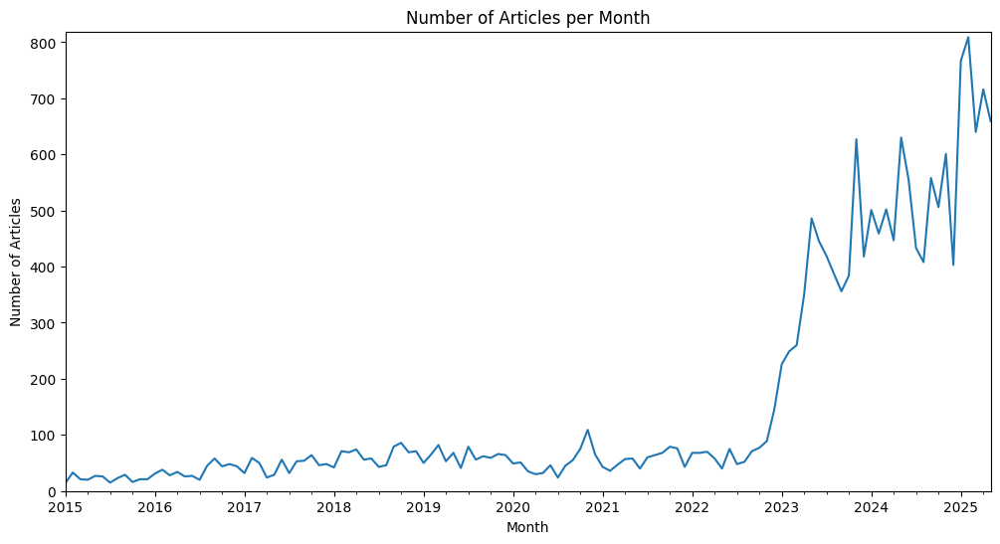

In [8]:
# set starting date to 2020-01-01
# set y axis start from 0 to max number of articles per month + 10
df_draw = df.copy()

df_draw = df_draw[df_draw['pubdate'] >= '2015-01-01']
df_draw.set_index('pubdate', inplace=False)
ax = df_draw.resample('ME', on='pubdate').size().plot(kind='line', figsize=(12,6))
plt.xlabel('Month')
plt.ylabel('Number of Articles')
plt.title('Number of Articles per Month')
ax.set_ylim(0, df_draw.resample('ME', on='pubdate').size().max() + 10)
plt.show()

C:\Users\terra\AppData\Local\Temp\ipykernel_20168\3468180978.py:6: FutureWarning: DataFrameGroupBy.resample operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ax = df_draw.groupby('source').resample('ME', on='pubdate').size().unstack(0).plot(kind='line', figsize=(12,6))


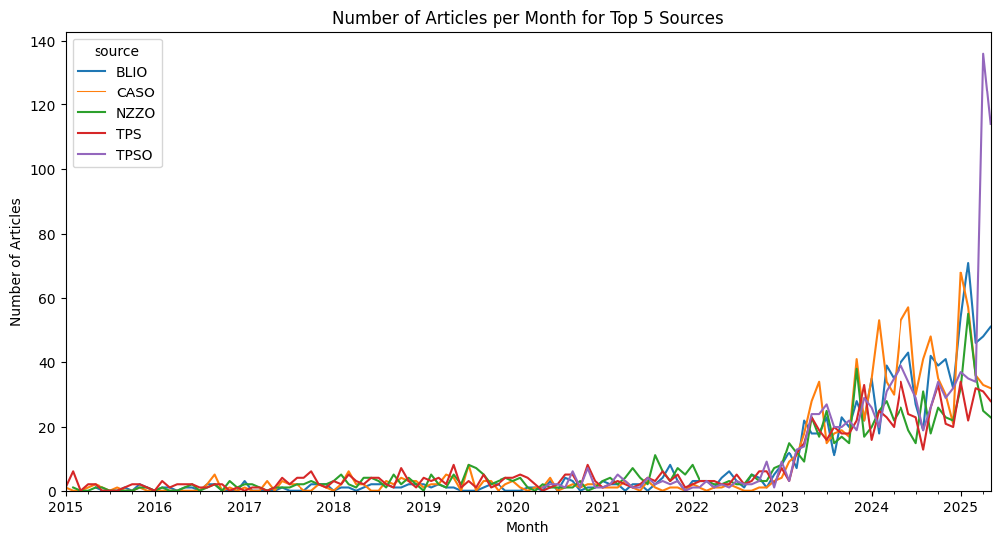

In [13]:
# set top 5 sources and draw line chart of number of articles per month for each source
df_draw = df.copy()
top_5_sources = df_draw['source'].value_counts().head(5).index.tolist()
df_draw = df_draw[df_draw['source'].isin(top_5_sources)]
df_draw = df_draw[df_draw['pubdate'] >= '2015-01-01']
ax = df_draw.groupby('source').resample('ME', on='pubdate').size().unstack(0).plot(kind='line', figsize=(12,6))
plt.xlabel('Month')
plt.ylabel('Number of Articles')
plt.title('Number of Articles per Month for Top 5 Sources')
ax.set_ylim(0, )
plt.show()

C:\Users\terra\AppData\Local\Temp\ipykernel_20168\28888328.py:5: FutureWarning: DataFrameGroupBy.resample operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ax = df_draw.groupby('source').resample('ME', on='pubdate').size().unstack(0).plot(kind='line', figsize=(12,6))


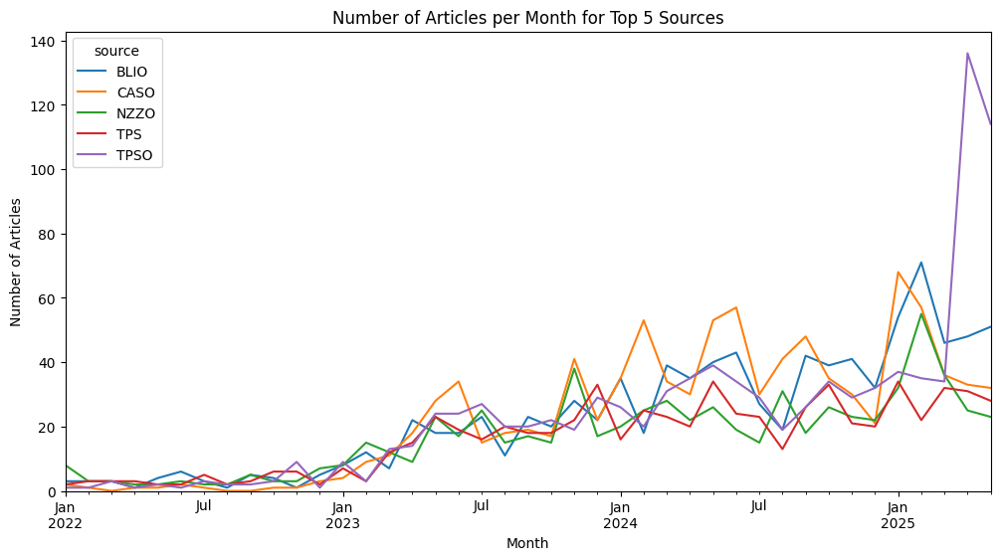

In [26]:
df_draw = df.copy()
top_5_sources = df_draw['source'].value_counts().head(5).index.tolist()
df_draw = df_draw[df_draw['source'].isin(top_5_sources)]
df_draw = df_draw[df_draw['pubdate'] >= '2022-01-01']
ax = df_draw.groupby('source').resample('ME', on='pubdate').size().unstack(0).plot(kind='line', figsize=(12,6))
plt.xlabel('Month')
plt.ylabel('Number of Articles')
plt.title('Number of Articles per Month for Top 5 Sources')

ax.set_ylim(0, )
plt.show()

C:\Users\terra\AppData\Local\Temp\ipykernel_20168\1198249334.py:3: FutureWarning: DataFrameGroupBy.resample operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ax = df_draw.groupby('language').resample('ME', on='pubdate').size().unstack(0).plot(kind='line', figsize=(12,6))


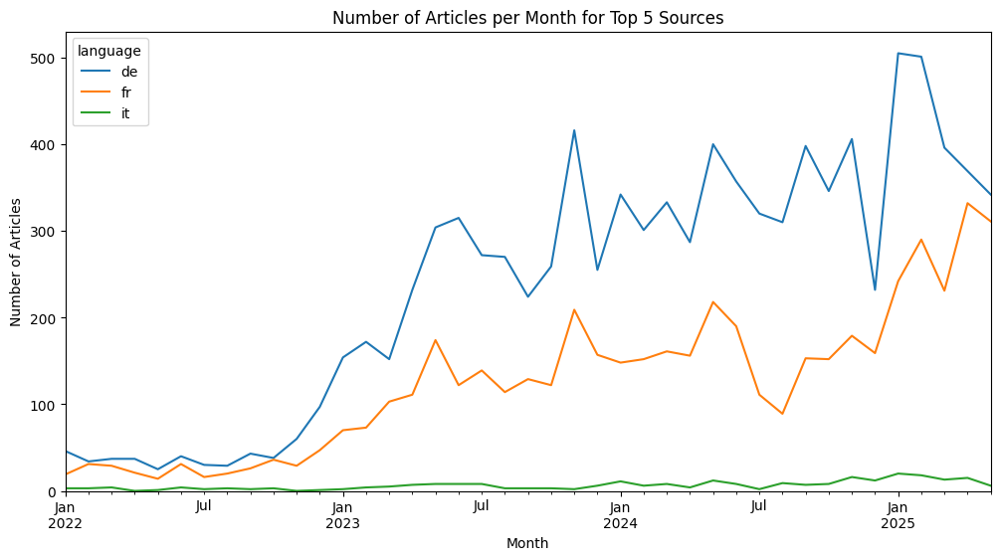

In [30]:
df_draw = df.copy()
df_draw = df_draw[df_draw['pubdate'] >= '2015-01-01']
ax = df_draw.groupby('language').resample('ME', on='pubdate').size().unstack(0).plot(kind='line', figsize=(12,6))
plt.xlabel('Month')
plt.ylabel('Number of Articles')
plt.title('Number of Articles per Month for Top 5 Sources')
ax.set_ylim(0, )
ax.set_xlim(pd.Timestamp('2022-01-01'), )
plt.show()

In [25]:
df.head()

,head,pubdate,source,articleURL,subtitle,language,title_full
0,Messi spricht jetzt sogar Englisch,2023-09-18,TA,None,None,de,Messi spricht jetzt sogar Englisch
1,Presseschau vom Wochenende 18 (29./30. April),2023-04-30,CASO,https://www.cash.ch/borsen-ticker/borse-schwei...,None,de,Presseschau vom Wochenende 18 (29./30. April)
2,Im Rausch der künstlichen Intelligenz,2024-05-16,SHZ,None,None,de,Im Rausch der künstlichen Intelligenz
3,Kaffee mit Chen Qiufan: «Künstliche Intelligen...,2022-10-14,FUWO,https://www.fuw.ch/kuenstliche-intelligenz-wir...,None,de,Kaffee mit Chen Qiufan: «Künstliche Intelligen...
4,Wer hat die beste KI?,2024-12-15,NZZS,None,None,de,Wer hat die beste KI?


In [23]:
# merge title and subtile into one column 'title_full' and drop subtitle if it is 'None'
df['title_full'] = df.apply(lambda row: row['head'] if pd.isna(row['subtitle']) or pd.isna(row['head']) else f"{row['head']} - {row['subtitle']}", axis=1)

# extract df as csv
df[df['language']=='de'].to_csv('swiss_ai_discourse_articles_de.csv', index=False)

### Questions
 - Can we sample language as a percentage of total articles over time?
    - we cannot identify whether one language group is more into the AI
- Topic wise modeling -> do we need multi translation?

In [35]:
# open 'data\de_edu.tsv' and read it as dataframe with tab separator
import pandas as pd
df_edu = pd.read_csv('data\de_edu_filtered_pre_topic_extraction.csv', sep=',')
df_edu.info()

<>:3: SyntaxWarning: invalid escape sequence '\d'
<>:3: SyntaxWarning: invalid escape sequence '\d'
C:\Users\terra\AppData\Local\Temp\ipykernel_204944\3613575806.py:3: SyntaxWarning: invalid escape sequence '\d'
  df_edu = pd.read_csv('data\de_edu_filtered_pre_topic_extraction.csv', sep=',')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24957 entries, 0 to 24956
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   id                   24957 non-null  int64 
 1   pubtime              24957 non-null  object
 2   medium_code          24957 non-null  object
 3   medium_name          24957 non-null  object
 4   rubric               20113 non-null  object
 5   regional             1190 non-null   object
 6   doctype              24957 non-null  object
 7   doctype_description  24957 non-null  object
 8   language             24957 non-null  object
 9   char_count           24957 non-null  int64 
 10  dateline             3398 non-null   object
 11  head                 24957 non-null  object
 12  subhead              1041 non-null   object
 13  article_link         7311 non-null   object
 14  content_id           24957 non-null  object
 15  content              24957 non-null  object
 16  cont

In [38]:
df_small = pd.read_csv('data\de_edu_small.csv', sep=',')
df_small.info()
df_small.head()

<>:1: SyntaxWarning: invalid escape sequence '\d'
<>:1: SyntaxWarning: invalid escape sequence '\d'
C:\Users\terra\AppData\Local\Temp\ipykernel_204944\2213743766.py:1: SyntaxWarning: invalid escape sequence '\d'
  df_small = pd.read_csv('data\de_edu_small.csv', sep=',')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24957 entries, 0 to 24956
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Unnamed: 0      24957 non-null  int64 
 1   id              24957 non-null  int64 
 2   pubtime         24957 non-null  object
 3   medium_name     24957 non-null  object
 4   head            24957 non-null  object
 5   subhead         1041 non-null   object
 6   content_parsed  24957 non-null  object
dtypes: int64(2), object(5)
memory usage: 1.3+ MB


,Unnamed: 0,id,pubtime,medium_name,head,subhead,content_parsed
0,0,54649159,2024-09-09 17:58:58+02,cash.ch,"Cembra-CEO: «Wir planen, die Dividende im Eink...",NaN,"Holger Laubenthal, CEO von Cembra Money Bank, ..."
1,1,52069904,2023-12-09 00:00:00+01,Berner Oberländer,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,"Social Media Wie gut moderieren Tiktok, Instag..."
2,2,52069885,2023-12-09 00:00:00+01,BZ - Langenthaler Tagblatt,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,"Social Media Wie gut moderieren Tiktok, Instag..."
3,3,52069873,2023-12-09 00:00:00+01,Berner Zeitung,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,"Social Media Wie gut moderieren Tiktok, Instag..."
4,4,52069995,2023-12-09 00:00:00+01,Thuner Tagblatt,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,"Social Media Wie gut moderieren Tiktok, Instag..."


In [39]:
# remove Unnamed:0 column from df_small
df_small = df_small.loc[:, ~df_small.columns.str.contains('^Unnamed')]
df_small.head()

,id,pubtime,medium_name,head,subhead,content_parsed
0,54649159,2024-09-09 17:58:58+02,cash.ch,"Cembra-CEO: «Wir planen, die Dividende im Eink...",NaN,"Holger Laubenthal, CEO von Cembra Money Bank, ..."
1,52069904,2023-12-09 00:00:00+01,Berner Oberländer,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,"Social Media Wie gut moderieren Tiktok, Instag..."
2,52069885,2023-12-09 00:00:00+01,BZ - Langenthaler Tagblatt,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,"Social Media Wie gut moderieren Tiktok, Instag..."
3,52069873,2023-12-09 00:00:00+01,Berner Zeitung,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,"Social Media Wie gut moderieren Tiktok, Instag..."
4,52069995,2023-12-09 00:00:00+01,Thuner Tagblatt,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,"Social Media Wie gut moderieren Tiktok, Instag..."


In [ ]:
duplicated_articles = df_small[df_small.duplicated(subset=['content_parsed'], keep=False)]['head'].unique().tolist()
duplicated_articles
# only leave one article per duplicated content_parsed
dup_out_df = df_small[df_small['head'].isin(duplicated_articles)]
dup_out_df

In [ ]:
# get ducplicated content_parseed from df_small, and leave only one row per duplicated content_parsed
# keep only rows whose content_parsed appears more than once, but keep one representative per duplicated content_parsed
dup_mask = df_small['content_parsed'].duplicated(keep=False)
df_dup_unique = df_small[dup_mask].drop_duplicates(subset=['content_parsed'], keep='first').reset_index(drop=True)
df_dup_unique

# get unique articles by using dup_mask
df_unique = df_small[~dup_mask].reset_index(drop=True)
df_unique

# sum up df_dup_unique and df_unique
df_final = pd.concat([df_dup_unique, df_unique], ignore_index=True)
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13202 entries, 0 to 13201
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   id              13202 non-null  int64 
 1   pubtime         13202 non-null  object
 2   medium_name     13202 non-null  object
 3   head            13202 non-null  object
 4   subhead         1039 non-null   object
 5   content_parsed  13202 non-null  object
dtypes: int64(1), object(5)
memory usage: 619.0+ KB


In [49]:
# check df_final for duplicated content_parsed
df_final.head()

,id,pubtime,medium_name,head,subhead,content_parsed
0,52069904,2023-12-09 00:00:00+01,Berner Oberländer,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,"Social Media Wie gut moderieren Tiktok, Instag..."
1,51555862,2023-10-17 17:37:42+02,berneroberlaender.ch,Analyse zu KI-Fake: Oder Glarner einfach ignor...,NaN,SVP-Nationalrat Andreas Glarner verhöhnt auf T...
2,48489468,2022-12-15 00:00:00+01,Aargauer Zeitung / MLZ,"Die Foto-App, die Frauen auszieht",NaN,Lensa macht aus Selfies Kunstwerke. Doch die K...
3,52923487,2024-03-08 00:00:00+01,Appenzeller Zeitung,Nachrichtendienst im Fokus,NaN,Nach dem Terrorangriff auf einen Juden muss Bu...
4,45388823,2022-02-09 05:30:00+01,nzz.ch,KOMMENTAR - Der Sozialroboter hilft – aber wie...,NaN,Die Pandemie hat den Digitalisierungsprozess i...


In [50]:
# export df_edu_cleaned as csv
df_final.to_csv('data/de_edu_for_topic.csv', index=False)

In [2]:
# open 'data\de_edu.tsv' and read it as dataframe with tab separator
import pandas as pd
df_edu = pd.read_csv('data/tmp/de_edu_bert_50.csv', sep=',')
df_edu.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24957 entries, 0 to 24956
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   head            24957 non-null  object
 1   subhead         1041 non-null   object
 2   pubtime         24957 non-null  object
 3   medium_name     24957 non-null  object
 4   combined_text   24957 non-null  object
 5   subtopic        24957 non-null  int64 
 6   subtopic_name   24957 non-null  object
 7   subtopic_label  24957 non-null  object
dtypes: int64(1), object(7)
memory usage: 1.5+ MB


In [3]:
df_edu.head()

,head,subhead,pubtime,medium_name,combined_text,subtopic,subtopic_name,subtopic_label
0,"Cembra-CEO: «Wir planen, die Dividende im Eink...",NaN,2024-09-09 17:58:58+02,cash.ch,"Cembra-CEO: «Wir planen, die Dividende im Eink...",-1,-1_zeit_macht_mal_leben,[]
1,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,2023-12-09 00:00:00+01,Berner Oberländer,Tiktok entfernt Inhalte zu Suizid fast nie. na...,88,outlier,False
2,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,2023-12-09 00:00:00+01,BZ - Langenthaler Tagblatt,Tiktok entfernt Inhalte zu Suizid fast nie. na...,88,outlier,False
3,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,2023-12-09 00:00:00+01,Berner Zeitung,Tiktok entfernt Inhalte zu Suizid fast nie. na...,88,outlier,False
4,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,2023-12-09 00:00:00+01,Thuner Tagblatt,Tiktok entfernt Inhalte zu Suizid fast nie. na...,88,outlier,False


In [ ]:
df_edu[df_edu['subtopic'] == -1][:20]

,head,subhead,pubtime,medium_name,combined_text,subtopic,subtopic_name,subtopic_label
0,"Cembra-CEO: «Wir planen, die Dividende im Eink...",NaN,2024-09-09 17:58:58+02,cash.ch,"Cembra-CEO: «Wir planen, die Dividende im Eink...",-1,-1_zeit_macht_mal_leben,[]
5,Analyse zu KI-Fake: Oder Glarner einfach ignor...,NaN,2023-10-17 17:37:42+02,berneroberlaender.ch,Analyse zu KI-Fake: Oder Glarner einfach ignor...,-1,-1_zeit_macht_mal_leben,[]
7,"Die Foto-App, die Frauen auszieht",NaN,2022-12-15 00:00:00+01,Aargauer Zeitung / MLZ,"Die Foto-App, die Frauen auszieht. nan. Lensa ...",-1,-1_zeit_macht_mal_leben,[]
8,"Die Foto-App, die Frauen auszieht",NaN,2022-12-15 00:00:00+01,Oltner Tagblatt / MLZ,"Die Foto-App, die Frauen auszieht. nan. Lensa ...",-1,-1_zeit_macht_mal_leben,[]
9,"Die Foto-App, die Frauen auszieht",NaN,2022-12-15 00:00:00+01,Thurgauer Zeitung,"Die Foto-App, die Frauen auszieht. nan. Lensa ...",-1,-1_zeit_macht_mal_leben,[]
10,"Die Foto-App, die Frauen auszieht",NaN,2022-12-15 00:00:00+01,Grenchner Tagblatt,"Die Foto-App, die Frauen auszieht. nan. Lensa ...",-1,-1_zeit_macht_mal_leben,[]
11,"Die Foto-App, die Frauen auszieht",NaN,2022-12-15 00:00:00+01,Obwaldner Zeitung,"Die Foto-App, die Frauen auszieht. nan. Lensa ...",-1,-1_zeit_macht_mal_leben,[]
12,"Die Foto-App, die Frauen auszieht",NaN,2022-12-15 00:00:00+01,Toggenburger Tagblatt,"Die Foto-App, die Frauen auszieht. nan. Lensa ...",-1,-1_zeit_macht_mal_leben,[]
13,"Die Foto-App, die Frauen auszieht",NaN,2022-12-15 00:00:00+01,Limmattaler Zeitung,"Die Foto-App, die Frauen auszieht. nan. Lensa ...",-1,-1_zeit_macht_mal_leben,[]
14,"Die Foto-App, die Frauen auszieht",NaN,2022-12-15 00:00:00+01,Wiler Zeitung,"Die Foto-App, die Frauen auszieht. nan. Lensa ...",-1,-1_zeit_macht_mal_leben,[]


In [23]:
# create pivot table for head count, and leave items with count more than 3
pivot_table = df_edu.pivot_table(index='head', values='medium_name', aggfunc='count')
filtered_pivot = pivot_table[pivot_table['medium_name'] > 3]
filtered_pivot

,medium_name
head,
(Offline-)Brief an die Mutter: Ich will das Internet nicht in meiner Tasche mittragen,6
100 Milliarden Börsenwert verloren: Googles neuer Chatbot gibt falsche Antwort: Aktienkurs bricht ein,10
100 Millionen Follower auf Tiktok: Woher kommt der Hype um Charli D'Amelio?,8
100’000 Dollar pro Person: Trumps Visa-Regeln könnten Schweizer Firmen Millionen kosten,6
10’000 Franken Gewinn: Das FuW-Börsenspiel beginnt: So können Sie jetzt noch mitmachen,4
...,...
"Ärger mit Apps, Updates etc.: Hallo Digitalisierung, ist das wirklich dein Ernst?",10
Überlisten Sie sich: Apps für mehr Ruhe,19
Übersetzen: Eine Frage der Verantwortung,18


In [25]:
duplicated_articles = filtered_pivot.index.to_list()

In [34]:
# check subtopic
dup_out_df = df_edu[df_edu['head'].isin(duplicated_articles) & (df_edu['subtopic'] == -1)]
# length of dup_out_df
len(dup_out_df)

6568

In [32]:
pivot_table2 = dup_out_df.pivot_table(index='head', values='medium_name', aggfunc='count')
pivot_table2

,medium_name
head,
100 Millionen Follower auf Tiktok: Woher kommt der Hype um Charli D'Amelio?,8
100’000 Dollar pro Person: Trumps Visa-Regeln könnten Schweizer Firmen Millionen kosten,6
10’000 Franken Gewinn: Das FuW-Börsenspiel beginnt: So können Sie jetzt noch mitmachen,4
11 Tipps für mehr Produktivität im Arbeitsalltag,18
20 Jahre Facebook: Eine gute Idee mit tragischem Ende,5
...,...
"Ärger mit Apps, Updates etc.: Hallo Digitalisierung, ist das wirklich dein Ernst?",10
Überlisten Sie sich: Apps für mehr Ruhe,19
Übersetzen: Eine Frage der Verantwortung,18


In [33]:
pivot_table2.index.to_list()

["100 Millionen Follower auf Tiktok: Woher kommt der Hype um Charli D'Amelio?",
 '100’000 Dollar pro Person: Trumps Visa-Regeln könnten Schweizer Firmen Millionen kosten',
 '10’000 Franken Gewinn: Das FuW-Börsenspiel beginnt: So können Sie jetzt noch mitmachen',
 '11 Tipps für mehr Produktivität im Arbeitsalltag',
 '20 Jahre Facebook: Eine gute Idee mit tragischem Ende',
 '50 Jahre Lidl: Hauptsache, das Geschäft läuft:\xa0Wie Lidl zu einem weltumspannenden Konzern wurde',
 ': Überbevölkerung? Von wegen!',
 'ABB übernimmt ETH-Start-up Sevensense vollständig',
 'ABB übernimmt Mehrheit am Software-Dienstleister Meshmind',
 'Abschied von der Überflussgesellschaft: Ärmer werden, glücklicher leben – eine Anleitung',
 'Ahnen-Kino mit «Deep Nostalgia»: Mata Hari lächelt, Nietzsche ist platt',
 'Aktientipps des Tages',
 'Aktuelle News aus dem Kanton Solothurn',
 'Aktuelle News aus der Region Olten',
 'Album enttäuscht: «Cringe» Zeilen und viel Groll: Taylor Swift entzaubert sich selbst',
 'Algo

In [6]:
# save df_edu_cleaned as csv
df_edu_cleaned.to_csv('df_edu_small.csv')

In [4]:
df_edu_cleaned['dateline'].unique()

array([nan, 'Weisheiten des Buddhismus', '5 Fragen an …', ...,
       'Porträt: Eddie Wu', 'Papst-Newsblog', 'Bevölkerungswachstum'],
      shape=(1254,), dtype=object)

In [3]:
df_edu_cleaned.head()

,id,pubtime,medium_name,head,subhead,dateline,content_parsed
0,54649159,2024-09-09 17:58:58+02,cash.ch,"Cembra-CEO: «Wir planen, die Dividende im Eink...",NaN,NaN,"Holger Laubenthal, CEO von Cembra Money Bank, ..."
1,52069904,2023-12-09 00:00:00+01,Berner Oberländer,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,NaN,"Social Media Wie gut moderieren Tiktok, Instag..."
2,52069885,2023-12-09 00:00:00+01,BZ - Langenthaler Tagblatt,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,NaN,"Social Media Wie gut moderieren Tiktok, Instag..."
3,52069873,2023-12-09 00:00:00+01,Berner Zeitung,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,NaN,"Social Media Wie gut moderieren Tiktok, Instag..."
4,52069995,2023-12-09 00:00:00+01,Thuner Tagblatt,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,NaN,"Social Media Wie gut moderieren Tiktok, Instag..."


In [5]:
df_edu['combined_text'][:5].to_list()

['Cembra-CEO: «Wir planen, die Dividende im Einklang mit nachhaltigem Gewinnwachstum ansteigen zu lassen». nan. Holger Laubenthal, CEO von Cembra Money Bank, äussert sich im cash-Interview zur Aktienkursentwicklung, der Dividendenpolitik und zum Geschäftsgang. Manuel Boeck Holger Laubenthal, CEO von Cembra Money Bank. Quelle: ZVG cash.ch: Die Aktien von Cembra haben seit Jahresbeginn um 20 Prozent zugelegt. Was sind Ihrer Meinung nach die Hauptgründe für diese positive Entwicklung? Holger Laubenthal: Es wird anerkannt, dass wir in der Umsetzung unserer Strategie gut vorankommen. Ein Beispiel dafür ist die neue Banking-Plattform für das Leasinggeschäft, die wir eingeführt haben, sowie unsere Aktivitäten auf der kommerziellen Seite, wie etwa die stetige Weiterentwicklung der Cembra App. Die Automatisierung und Digitalisierung führen zu den Effizienzgewinnen, die wir uns vorgenommen haben, und die sich nun in den Zahlen widerspiegeln. Kursentwicklung der Cembra-Aktien. Geht es um Vertraue

In [13]:
df_edu[df_edu['head'] == "Das Erfolgsrezept von «Zivadiliring»"]

,head,subhead,pubtime,medium_name,article_cleaned,subtopic,subtopic_name
310,Das Erfolgsrezept von «Zivadiliring»,NaN,2025-01-11 00:00:00+01,Der Bund,erfolgsrezept zivadiliring nan ausverkauftes h...,-1,-1_unternehmen_mitteilung_umsatz_november
311,Das Erfolgsrezept von «Zivadiliring»,NaN,2025-01-11 00:00:00+01,Basler Zeitung,erfolgsrezept zivadiliring nan ausverkauftes h...,-1,-1_unternehmen_mitteilung_umsatz_november
312,Das Erfolgsrezept von «Zivadiliring»,NaN,2025-01-11 00:00:00+01,BZ - Langenthaler Tagblatt,erfolgsrezept zivadiliring nan ausverkauftes h...,-1,-1_unternehmen_mitteilung_umsatz_november
313,Das Erfolgsrezept von «Zivadiliring»,NaN,2025-01-11 00:00:00+01,Berner Zeitung,erfolgsrezept zivadiliring nan ausverkauftes h...,-1,-1_unternehmen_mitteilung_umsatz_november
314,Das Erfolgsrezept von «Zivadiliring»,NaN,2025-01-11 00:00:00+01,Berner Oberländer,erfolgsrezept zivadiliring nan ausverkauftes h...,-1,-1_unternehmen_mitteilung_umsatz_november
315,Das Erfolgsrezept von «Zivadiliring»,NaN,2025-01-11 00:00:00+01,Thuner Tagblatt,erfolgsrezept zivadiliring nan ausverkauftes h...,-1,-1_unternehmen_mitteilung_umsatz_november
316,Das Erfolgsrezept von «Zivadiliring»,NaN,2025-01-11 00:00:00+01,Tages-Anzeiger,erfolgsrezept zivadiliring nan ausverkauftes h...,-1,-1_unternehmen_mitteilung_umsatz_november


In [11]:
df_raw = pd.read_csv('data/de_edu_cleaned.csv', sep=',')
df_raw.head()

,id,pubtime,medium_code,medium_name,rubric,regional,doctype,doctype_description,language,char_count,...,head,subhead,article_link,content_id,content,content_parsed,combined_text,filter_region,article_cleaned,subtopic
0,54649159,2024-09-09 17:58:58+02,CASO,cash.ch,NaN,NaN,WWE,Online medium,de,11356,...,"Cembra-CEO: «Wir planen, die Dividende im Eink...",NaN,https://www.cash.ch/news/top-news/cembra-ceo-w...,00017ed1-4f9f-e6a7-e61a-4ca34546c752,"<tx><ld><p>Holger Laubenthal, CEO von Cembra M...","Holger Laubenthal, CEO von Cembra Money Bank, ...","Cembra-CEO: «Wir planen, die Dividende im Eink...",False,cembra-ceo planen dividende einklang nachhalti...,2
1,52069904,2023-12-09 00:00:00+01,BEOL,Berner Oberländer,Wirtschaft,NaN,PRD,Regional daily newspaper,de,7151,...,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,NaN,0006d143-04ef-d2e6-6465-61ac27be9cca,<tx><ld><p>Social Media Wie gut moderieren Tik...,"Social Media Wie gut moderieren Tiktok, Instag...",Tiktok entfernt Inhalte zu Suizid fast nie. na...,False,tiktok entfernt inhalt suizid fast nan social ...,50
2,52069885,2023-12-09 00:00:00+01,LAT,BZ - Langenthaler Tagblatt,Wirtschaft,NaN,PRD,Regional daily newspaper,de,7151,...,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,NaN,0006d143-04ef-d2e6-6465-61ac27be9cca,<tx><ld><p>Social Media Wie gut moderieren Tik...,"Social Media Wie gut moderieren Tiktok, Instag...",Tiktok entfernt Inhalte zu Suizid fast nie. na...,False,tiktok entfernt inhalt suizid fast nan social ...,50
3,52069873,2023-12-09 00:00:00+01,BZ,Berner Zeitung,Wirtschaft,BZ Ausgabe Burgdorf + Emmental,PRD,Regional daily newspaper,de,7151,...,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,NaN,0006d143-04ef-d2e6-6465-61ac27be9cca,<tx><ld><p>Social Media Wie gut moderieren Tik...,"Social Media Wie gut moderieren Tiktok, Instag...",Tiktok entfernt Inhalte zu Suizid fast nie. na...,False,tiktok entfernt inhalt suizid fast nan social ...,50
4,52069995,2023-12-09 00:00:00+01,THT,Thuner Tagblatt,Wirtschaft,NaN,PRD,Regional daily newspaper,de,7151,...,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,NaN,0006d143-04ef-d2e6-6465-61ac27be9cca,<tx><ld><p>Social Media Wie gut moderieren Tik...,"Social Media Wie gut moderieren Tiktok, Instag...",Tiktok entfernt Inhalte zu Suizid fast nie. na...,False,tiktok entfernt inhalt suizid fast nan social ...,50


In [12]:
df_raw[df_raw['head'] == "Das Erfolgsrezept von «Zivadiliring»"]["content_parsed"].to_list()

['Ausverkauftes Hallenstadion Nach Podcast-Aus bei SRF: Was Maja Zivadinovic, Gülsha Adilji und Yvonne Eisenring so erfolgreich macht. SRF nimmt einen seiner erfolgreichsten Podcasts aus dem Programm. «Zivadiliring» der drei Hosts Yvonne Eisenring, Gülsha Adilji und Maja Zivadinovic wird nicht mehr weiter produziert. Grund für die sofortige Einstellung des zweiwöchentlichen Talk-Formats sind die publizistischen Richtlinien von SRF, wie es in einer Mitteilung vom vergangenen Dienstag hiess. Wer regelmässig für SRF journalistisch tätig ist, darf daneben keine Werbeaufträge oder andere kommerzielle Engagements annehmen. Das betrifft auch die drei Frauen. Das Unverständnis bei den Fans nach der Bekanntgabe am Dienstag war gross. Im September 2021 gestartet, hatten sich die Frauen über die letzten drei Jahre eine treue Hörerschaft erarbeitet. Beim Vorverkauf der Liveshows 2024 legten 80’000 Klicks innerhalb von fünf Minuten das Ticketingsystem des Zürcher Konzertlokals Kaufleuten lahm. Dara

In [6]:
# save new_df as csv
new_df.to_csv('data/de_edu_filtered.csv', index=False)

In [12]:
df_edu['content'].tolist()
# parse html tags from content column
from bs4 import BeautifulSoup
df_edu['content_parsed'] = df_edu['content'].apply(lambda x: BeautifulSoup(x, 'html.parser').get_text() if pd.notna(x) else x)
df_edu['content_parsed'].tolist()

['Holger Laubenthal, CEO von Cembra Money Bank, äussert sich im cash-Interview zur Aktienkursentwicklung, der Dividendenpolitik und zum Geschäftsgang.Manuel BoeckHolger Laubenthal, CEO von Cembra Money Bank. Quelle: ZVGcash.ch: Die Aktien von Cembra haben seit Jahresbeginn um 20 Prozent zugelegt. Was sind Ihrer Meinung nach die Hauptgründe für diese positive Entwicklung?Holger Laubenthal: Es wird anerkannt, dass wir in der Umsetzung unserer Strategie gut vorankommen. Ein Beispiel dafür ist die neue Banking-Plattform für das Leasinggeschäft, die wir eingeführt haben, sowie unsere Aktivitäten auf der kommerziellen Seite, wie etwa die stetige Weiterentwicklung derCembraApp. Die Automatisierung und Digitalisierung führen zu den Effizienzgewinnen, die wir uns vorgenommen haben, und die sich nun in den Zahlen widerspiegeln.Kursentwicklung der Cembra-Aktien.Geht es um Vertrauen?Das ist sicherlich ein wichtiger Punkt. Wir konnten die Volatilität und die Herausforderungen im Markt gut meistern.

In [ ]:
# leave pubtime shaped as '2024-09-09 17:58:58+02' to only year-month-day
# get first 10 entries of pubtime column
df_edu['pubtime'] = pd.to_datetime(df_edu['pubtime'].str[:10], errors='coerce').dt.date
df_edu['pubtime'].head()

AttributeError: Can only use .str accessor with string values!

In [24]:
# keep only columns: 'head', 'content_parsed', 'pubtime', 'source'
df_edu = df_edu[['head', 'subhead', 'content_parsed', 'pubtime', 'medium_name']]
df_edu.head()

,head,subhead,content_parsed,pubtime,medium_name
0,"Cembra-CEO: «Wir planen, die Dividende im Eink...",NaN,"Holger Laubenthal, CEO von Cembra Money Bank, ...",2024-09-09,cash.ch
1,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,"Social Media Wie gut moderieren Tiktok, Instag...",2023-12-09,Berner Oberländer
2,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,"Social Media Wie gut moderieren Tiktok, Instag...",2023-12-09,BZ - Langenthaler Tagblatt
3,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,"Social Media Wie gut moderieren Tiktok, Instag...",2023-12-09,Berner Zeitung
4,Tiktok entfernt Inhalte zu Suizid fast nie,NaN,"Social Media Wie gut moderieren Tiktok, Instag...",2023-12-09,Thuner Tagblatt


In [25]:
# save df_edu as csv
df_edu.to_csv('df_edu.csv', index=False)